In [1]:
## TO RUN ON THE CLOUD 

## preprocessed the data before starting the slide
## import embeddings <s
import os

# Define the URI to point to your manual process
os.environ["FIFTYONE_DATABASE_URI"] = "mongodb://localhost:44123"

import fiftyone as fo

# Verify connection
print(fo.core.odm.database.get_db_conn()) 


You are running the oldest supported major version of MongoDB. Please refer to https://deprecation.voxel51.com for deprecation notices. You can suppress this exception by setting your `database_validation` config parameter to `False`. See https://docs.voxel51.com/user_guide/config.html#configuring-a-mongodb-connection for more information
Database(MongoClient(host=['localhost:44123'], document_class=dict, tz_aware=False, connect=True, appname='fiftyone'), 'fiftyone')


In [2]:
import fiftyone as fo

## list all dataset
print(fo.list_datasets())

# Close any zombie sessions that might be hanging
fo.close_app()

['FLPLAN', 'dugong', 'flplan200', 'flplanpatches']


In [18]:
import sys
%load_ext autoreload
%autoreload 2

# import sys
sys.path.append("/share/home/e2406743/code/Dugongs_IRISA-MARBEC-LIRMM/chapter2_FLPLAN/src")


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# 15/06 Meeting

In [3]:
dataset = fo.load_dataset("FLPLAN")

In [ ]:
import pandas as pd
import os 
from pathlib import Path
import seaborn as sns
import seaborn as sns
import plotly.express as px
import numpy as np
import plotly.graph_objects as go
from plotly.subplots import make_subplots

## renders plotly properly in a html instance. 
import plotly.io as pio
pio.renderers.default = "notebook"

In [5]:
## Load the methods-results
df_ratio = pd.read_parquet("/share/home/e2406743/code/Dugongs_IRISA-MARBEC-LIRMM/chapter2_FLPLAN/studies/evaluation_metrics/concat_aclrratio.parquet")
df_ball = pd.read_parquet("/share/home/e2406743/code/Dugongs_IRISA-MARBEC-LIRMM/chapter2_FLPLAN/studies/evaluation_metrics/ball_radius/concat_aclrcball.parquet")
df_centr = pd.read_parquet("/share/home/e2406743/code/Dugongs_IRISA-MARBEC-LIRMM/chapter2_FLPLAN/studies/evaluation_metrics/concat_aclrratio.parquet")

In [7]:
df_centr['method'] = df_centr['eval_key'].apply(lambda x:x.split('_')[0])
df_centr['partition'] = df_centr['eval_key'].apply(lambda x:x.split('_')[1])
df_centr['baseline_bool'] = df_centr['eval_key'].apply(lambda x:True if 'baseline' in x else False)

In [8]:
df_ratio['method'] = df_ratio['eval_key'].apply(lambda x:x.split('_')[0])
df_ratio['partition'] = df_ratio['eval_key'].apply(lambda x:x.split('_')[1])
df_ratio['baseline_bool'] = df_ratio['eval_key'].apply(lambda x:True if 'baseline' in x else False)

In [9]:
df_ball['method'] = df_ball['eval_key'].apply(lambda x:x.split('_')[0])
df_ball['partition'] = df_ball['eval_key'].apply(lambda x:x.split('_')[1])
df_ball['baseline_bool'] = df_ball['eval_key'].apply(lambda x:True if 'baseline' in x else False)

In [13]:
df_centr.columns

Index(['seed', 'eval_key', 'mAP', 'mAR', 'f1_threshold', 'f1', 'precision_f1',
       'recall_f1', 'tp_f1', 'fp_f1', 'fn_f1', 'eer_threshold', 'fn_rate_eer',
       'fp_rate_eer', 'precision_eer', 'recall_eer', 'tp_eer', 'fp_eer',
       'fn_eer', 'n_gt', 'iou_thresh', 'positive_label', 'threshold',
       'f1_score', 'precision', 'recall', 'tp', 'fp', 'fn', 'method',
       'partition', 'baseline_bool'],
      dtype='str')

In [14]:
df_centr.head()

,seed,eval_key,mAP,mAR,f1_threshold,f1,precision_f1,recall_f1,tp_f1,fp_f1,...,threshold,f1_score,precision,recall,tp,fp,fn,method,partition,baseline_bool
0,0,aclr_p40_seed0_nms,0.740619,0.778571,0.930905,0.833333,1.000000,0.714286,10,0,...,0.930905,0.833333,1.000000,0.714286,10,0,4,aclr,p40,False
1,0,random_p40_seed0_nms,0.737654,0.778571,0.950603,0.857143,0.857143,0.857143,12,2,...,0.950603,0.857143,0.857143,0.857143,12,2,2,random,p40,False
2,0,random_p50_seed0_nms,0.762525,0.800000,0.162663,0.866667,0.812500,0.928571,13,3,...,0.162663,0.866667,0.812500,0.928571,13,3,1,random,p50,False
3,0,aclr_p10_seed0_nms,0.743795,0.757143,0.861960,0.923077,1.000000,0.857143,12,0,...,0.861960,0.923077,1.000000,0.857143,12,0,2,aclr,p10,False
4,0,random_p5_seed0_nms,0.584933,0.628571,0.911206,0.740741,0.769231,0.714286,10,3,...,0.911206,0.740741,0.769231,0.714286,10,3,4,random,p5,False


## Overall Results

In [ ]:


# ── Partition order ───────────────────────────────────────────────────────────
PARTITION_ORDER = ["p10", "p20", "p30", "p40", "p50", "p100"]

# ── Strategy registry ─────────────────────────────────────────────────────────
STRATEGIES = {
    "Centroid":          df_centr,
    "Ball Radius":     df_ball,
    "Ratio":       df_ratio,
}

# ── Colours ───────────────────────────────────────────────────────────────────
COLOR_ACLR   = "#456CBE"   # blue   — active learning line
COLOR_RANDOM = "#BB4B4B"   # red    — random baseline
COLOR_BASELINE = "#6C9585"   # grey — flat random average

def _aggregate(df: pd.DataFrame, metric: str) -> pd.DataFrame:
    """
    Compute mean ± std across seeds for each (method, partition) cell.

    Returns a dataframe with columns:
        method | partition | mean | std
    """
    return (
        df.groupby(["method", "partition"])[metric]
        .agg(mean="mean", std="std")
        .reset_index()
    )


def _add_line(
    fig,
    agg:        pd.DataFrame,
    method:     str,
    color:      str,
    name:       str,
    row:        int,
    col:        int,
    showlegend: bool = True,
):
    """Add one mean line + std error band to a subplot cell."""
    subset = (
        agg[agg["method"] == method]
        .set_index("partition")
        .reindex(PARTITION_ORDER)
        .reset_index()
    )

    x    = subset["partition"].tolist()
    mean = subset["mean"].tolist()
    std  = subset["std"].fillna(0).tolist()

    # ── Shaded error band ─────────────────────────────────────────────────
    x_band  = x + x[::-1]
    y_upper = [m + s for m, s in zip(mean, std)]
    y_lower = [m - s for m, s in zip(mean, std)]
    y_band  = y_upper + y_lower[::-1]

    fig.add_trace(
        go.Scatter(
            x           = x_band,
            y           = y_band,
            fill        = "toself",
            fillcolor   = color,
            opacity     = 0.15,
            line        = dict(width=0),
            hoverinfo   = "skip",
            showlegend  = False,
        ),
        row=row, col=col,
    )

    # ── Mean line + error bars ────────────────────────────────────────────
    fig.add_trace(
        go.Scatter(
            x          = x,
            y          = mean,
            mode       = "lines+markers",
            name       = name,
            legendgroup= name,
            showlegend = showlegend,
            line       = dict(color=color, width=2.5),
            marker     = dict(size=7, color=color),
            error_y    = dict(
                type      = "data",
                array     = std,
                visible   = True,
                color     = color,
                thickness = 1.5,
                width     = 4,
            ),
        ),
        row=row, col=col,
    )

def _add_baseline_hline(
    fig,
    df:         pd.DataFrame,
    metric:     str,
    color:      str  = "#6B7280",
    row:        int  = 1,
    col:        int  = 1,
    showlegend: bool = True,
):
    """
    Horizontal dashed line at the mean of rows flagged baseline_bool==True,
    averaged across the 3 seeds. Shaded band = ± 1 std across those seeds.

    Represents zero-shot NC performance — the floor before any fine-tuning.
    """
    baseline_vals = df[df["baseline_bool"] == True][metric].dropna()

    if baseline_vals.empty:
        print(f"WARNING: no baseline_bool==True rows found in dataframe for metric '{metric}'")
        return

    mean = baseline_vals.mean()
    std  = baseline_vals.std()

    x_range = PARTITION_ORDER

    # ── Shaded std band ───────────────────────────────────────────────────
    fig.add_trace(
        go.Scatter(
            x          = x_range + x_range[::-1],
            y          = [mean + std] * len(x_range) + [mean - std] * len(x_range),
            fill       = "toself",
            fillcolor  = color,
            opacity    = 0.10,
            line       = dict(width=0),
            hoverinfo  = "skip",
            showlegend = False,
        ),
        row=row, col=col,
    )

    # ── Mean horizontal line ──────────────────────────────────────────────
    fig.add_trace(
        go.Scatter(
            x          = x_range,
            y          = [mean] * len(x_range),
            mode       = "lines",
            name       = "Zero-shot baseline",
            legendgroup= "baseline_hline",
            showlegend = showlegend,
            line       = dict(
                color = color,
                width = 2,
                dash  = "dash",
            ),
            hovertemplate = (
                f"Zero-shot baseline<br>"
                f"{metric}={mean:.3f} ± {std:.3f}<extra></extra>"
            ),
        ),
        row=row, col=col,
    )

def plot_learning_curves(
    metric:    str  = "mAP",
    height:    int  = 650,
    width:     int  = 1300,
) -> go.Figure:
    """
    One subplot per strategy — each showing aclr vs its own random baseline.
    Error bars and shaded bands represent ± 1 std across 3 seeds.

    Parameters
    ----------
    metric  : column name to plot — "mAP", "mAR", "f1"
    height  : figure height in pixels
    width   : figure width in pixels
    """
    
    strategy_names = list(STRATEGIES.keys())
    n_cols         = len(strategy_names)

    fig = make_subplots(
        rows             = 1,
        cols             = n_cols,
        subplot_titles   = strategy_names,
        shared_yaxes     = True,
        horizontal_spacing = 0.06,
    )

    for col_idx, (strategy_name, df) in enumerate(STRATEGIES.items(), start=1):
        agg        = _aggregate(df, metric)
        showlegend = (col_idx == 1)

        # Per-partition aclr vs random lines
        _add_line(fig, agg, "aclr",   COLOR_ACLR,   "ACLR",   row=1, col=col_idx, showlegend=showlegend)
        _add_line(fig, agg, "random", COLOR_RANDOM, "Random", row=1, col=col_idx, showlegend=showlegend)

        # Flat baseline — random averaged across all partitions and seeds
        _add_baseline_hline(fig, df, metric, row=1, col=col_idx, showlegend=showlegend)

    # ── Layout ────────────────────────────────────────────────────────────
    fig.update_layout(
        height      = height,
        width       = width,
        title       = dict(
            text = f"<b>Active Learning — {metric} vs Partition</b>"
                   "<br><sup>Mean ± 1 std across 3 seeds</sup>",
            x    = 0.5,
            xanchor = "center",
            font = dict(size=16),
        ),
        legend      = dict(
            orientation = "h",
            yanchor     = "bottom",
            y           = -0.18,
            xanchor     = "center",
            x           = 0.5,
            font        = dict(size=13),
        ),
        plot_bgcolor  = "white",
        paper_bgcolor = "white",
        font          = dict(family="Arial", size=12),
    )

    # ── Axes styling ──────────────────────────────────────────────────────
    for col_idx in range(1, n_cols + 1):
        fig.update_xaxes(
            title_text      = "Partition",
            categoryorder   = "array",
            categoryarray   = PARTITION_ORDER,
            tickangle       = -30,
            showgrid        = True,
            gridcolor       = "#E5E7EB",
            linecolor       = "#9CA3AF",
            row=1, col=col_idx,
        )
        fig.update_yaxes(
            title_text  = metric if col_idx == 1 else "",
            showgrid    = True,
            gridcolor   = "#E5E7EB",
            linecolor   = "#9CA3AF",
            tickformat  = ".2f",
            row=1, col=col_idx,
        )

    return fig



In [44]:
fig = plot_learning_curves(metric="mAP")
fig.show()

In [45]:
fig = plot_learning_curves(metric="mAR")
fig.show()

In [46]:
# Switch metric — same function
plot_learning_curves(metric="f1").show()


### Same Metrics given by optimal F1 threshold

In [18]:
df_centr.columns

Index(['seed', 'eval_key', 'mAP', 'mAR', 'f1_threshold', 'f1', 'precision_f1',
       'recall_f1', 'tp_f1', 'fp_f1', 'fn_f1', 'eer_threshold', 'fn_rate_eer',
       'fp_rate_eer', 'precision_eer', 'recall_eer', 'tp_eer', 'fp_eer',
       'fn_eer', 'n_gt', 'iou_thresh', 'positive_label', 'threshold',
       'f1_score', 'precision', 'recall', 'tp', 'fp', 'fn', 'method',
       'partition', 'baseline_bool'],
      dtype='str')

![alt text](../presentation/images/opt_thre_f1.jpeg.png)

In [47]:
plot_learning_curves(metric="precision_f1").show()

In [48]:
plot_learning_curves(metric="recall_f1").show()

# Comparing the influence of each seed test

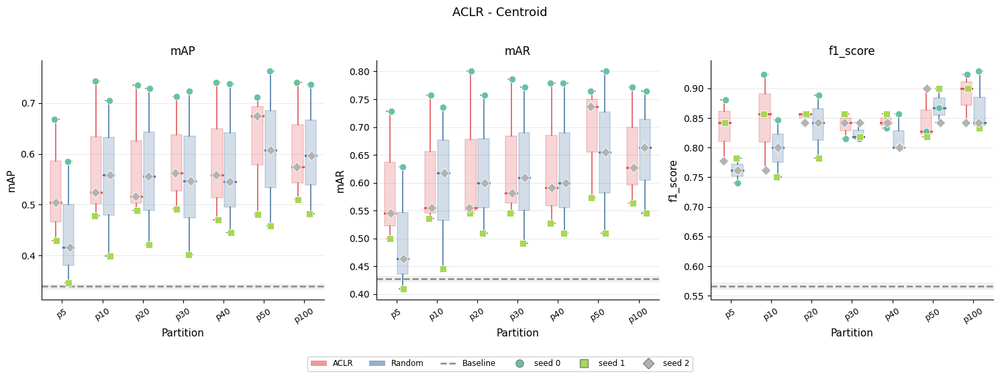

In [ ]:
from plot_analysis import (
    plot_box_strip,
)

# Plot 1 — box + strip, two metrics side by side
fig = plot_box_strip(df_centr, 
               metrics=["mAP","mAR", "f1_score"],
               title="ACLR - Centroid")



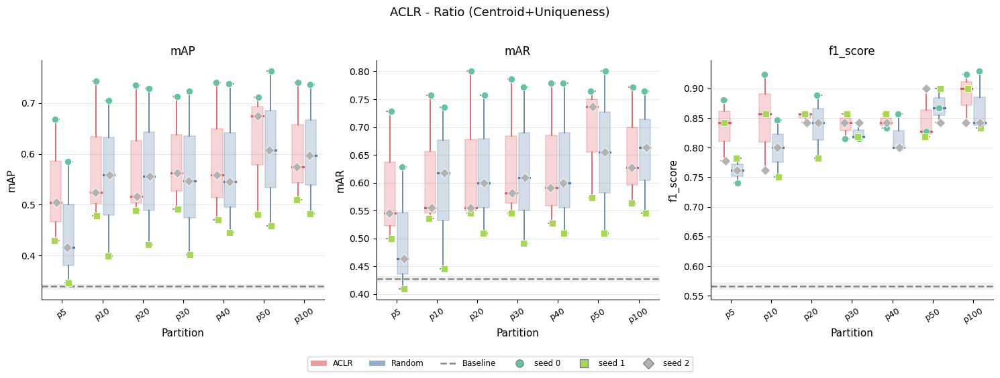

In [22]:
fig = plot_box_strip(df_ratio, 
               metrics=["mAP","mAR", "f1_score"],
               title="ACLR - Ratio (Centroid+Uniqueness)")

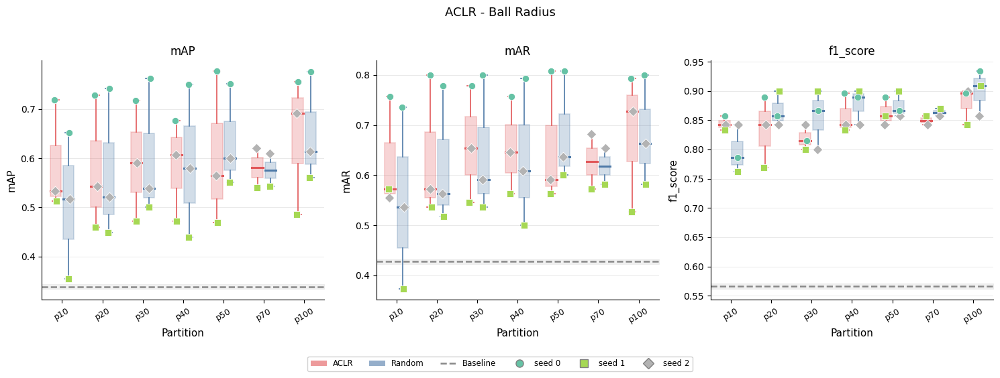

In [24]:
fig = plot_box_strip(df_ball, 
               metrics=["mAP","mAR", "f1_score"],
               title="ACLR - Ball Radius")

In [21]:
import matplotlib.pyplot as plt
import matplotlib.lines as mlines
import numpy as np
import pandas as pd

# ── Constants ─────────────────────────────────────────────────────────────────
PARTITION_ORDER  = ["p5", "p10", "p20", "p30", "p40", "p50", "p100"]
PARTITION_XTICKS = [5, 10, 20, 30, 40, 50, 100]
SEEDS            = [0, 1, 2]
METRIC           = "mAP"

STRATEGY_COLORS = {
    "Centroid Only":      "#2563EB",
    "Ball Radius (ACLR)": "#16A34A",
    "Centroid + Ratio":   "#9333EA",
}
STRATEGY_MARKERS = {
    "Centroid Only":      "o",
    "Ball Radius (ACLR)": "s",
    "Centroid + Ratio":   "^",
}

COLOR_BASELINE = "#6B7280"
METHODS        = ["aclr", "random"]
METHOD_LABELS  = {"aclr": "ACLR", "random": "Random"}

STRATEGIES = {
    "Centroid Only":      df_centr,
    "Ball Radius (ACLR)": df_ball,
    "Centroid + Ratio":   df_ratio,
}


# ── Helpers ───────────────────────────────────────────────────────────────────

def _get_seed_curve(df, method, seed, metric):
    """Return (x, y) arrays for one (method, seed) learning curve."""
    sub = df[(df["method"] == method) & (df["seed"] == seed)]
    sub = sub.set_index("partition").reindex(PARTITION_ORDER)
    return PARTITION_XTICKS, sub[metric].tolist()


def _get_baseline(df, metric):
    """Mean ± std of baseline_bool==True rows across all seeds."""
    vals = df[df["baseline_bool"] == True][metric].dropna()
    return vals.mean(), vals.std()


def _style_ax(ax):
    ax.set_facecolor("white")
    ax.grid(True, axis="y", color="#E5E7EB", linewidth=0.8, zorder=0)
    ax.grid(False, axis="x")
    ax.spines[["top", "right"]].set_visible(False)
    ax.spines[["left", "bottom"]].set_color("#9CA3AF")
    ax.set_xticks(PARTITION_XTICKS)
    ax.set_xticklabels([f"p{p}" for p in PARTITION_XTICKS],
                       rotation=30, fontsize=8)
    ax.set_xlim(0, 110)


# ── Main plot ─────────────────────────────────────────────────────────────────

def plot_per_seed_grid(
    metric:   str   = METRIC,
    figsize:  tuple = None,
    save_path: str  = None,
):
    """
    Grid plot: 2 rows × 3 cols
      rows    = method  (ACLR top, Random bottom)
      columns = seed    (seed 0, seed 1, seed 2)

    Each subplot shows one learning curve per strategy (3 lines)
    plus a horizontal dashed baseline.

    Parameters
    ----------
    metric    : metric column to plot
    figsize   : override figure size
    save_path : optional path prefix to save .png and .pdf
    """
    n_rows = len(METHODS)    # 2
    n_cols = len(SEEDS)      # 3

    fig, axes = plt.subplots(
        n_rows, n_cols,
        figsize = figsize or (5 * n_cols, 4 * n_rows),
        sharex  = True,
        sharey  = True,
    )
    fig.patch.set_facecolor("white")

    for row_idx, method in enumerate(METHODS):
        for col_idx, seed in enumerate(SEEDS):
            ax = axes[row_idx][col_idx]
            _style_ax(ax)

            # ── Baseline horizontal line ──────────────────────────────────
            # Pool baseline across all three strategy dfs for this seed
            baseline_vals = pd.concat([
                df[(df["baseline_bool"] == True) & (df["seed"] == seed)][metric]
                for df in STRATEGIES.values()
            ]).dropna()

            if not baseline_vals.empty:
                b_mean = baseline_vals.mean()
                b_std  = baseline_vals.std()
                ax.axhline(
                    b_mean,
                    color     = COLOR_BASELINE,
                    linewidth = 1.8,
                    linestyle = "--",
                    zorder    = 2,
                    label     = f"Zero-shot ({b_mean:.2f})",
                )
                ax.fill_between(
                    [0, 110],
                    b_mean - b_std,
                    b_mean + b_std,
                    color   = COLOR_BASELINE,
                    alpha   = 0.08,
                    zorder  = 1,
                )

            # ── One learning curve per strategy ───────────────────────────
            for strategy_name, df in STRATEGIES.items():
                color  = STRATEGY_COLORS[strategy_name]
                marker = STRATEGY_MARKERS[strategy_name]

                x, y = _get_seed_curve(df, method, seed, metric)

                # Drop NaN positions
                pairs  = [(xi, yi) for xi, yi in zip(x, y)
                          if not (yi != yi)]   # NaN check
                if not pairs:
                    continue
                x_plot, y_plot = zip(*pairs)

                ax.plot(
                    x_plot, y_plot,
                    color     = color,
                    marker    = marker,
                    linewidth = 2,
                    markersize= 7,
                    zorder    = 3,
                    label     = strategy_name,
                    markeredgecolor = "white",
                    markeredgewidth = 0.8,
                )

            # ── Subplot title ─────────────────────────────────────────────
            ax.set_title(
                f"Seed {seed}",
                fontsize   = 11,
                fontweight = "500",
                pad        = 6,
            )

            # ── Row label (left column only) ──────────────────────────────
            if col_idx == 0:
                ax.set_ylabel(
                    f"{METHOD_LABELS[method]}\n{metric}",
                    fontsize   = 11,
                    fontweight = "500",
                )

            # ── x label (bottom row only) ─────────────────────────────────
            if row_idx == n_rows - 1:
                ax.set_xlabel("Partition", fontsize=10)

    # ── Shared legend ─────────────────────────────────────────────────────
    strategy_handles = [
        mlines.Line2D(
            [], [],
            color      = STRATEGY_COLORS[s],
            marker     = STRATEGY_MARKERS[s],
            linewidth  = 2,
            markersize = 7,
            label      = s,
        )
        for s in STRATEGIES
    ]
    baseline_handle = mlines.Line2D(
        [], [],
        color     = COLOR_BASELINE,
        linewidth = 1.8,
        linestyle = "--",
        label     = "Zero-shot baseline",
    )

    fig.legend(
        handles        = strategy_handles + [baseline_handle],
        loc            = "lower center",
        ncol           = len(STRATEGIES) + 1,
        fontsize       = 10,
        frameon        = True,
        framealpha     = 0.9,
        bbox_to_anchor = (0.5, -0.04),
    )

    fig.suptitle(
        f"{metric} learning curves per seed\n"
        f"Top: ACLR strategies  ·  Bottom: Random baselines",
        fontsize   = 13,
        fontweight = "500",
        y          = 1.02,
    )
    plt.tight_layout()

    if save_path:
        fig.savefig(f"{save_path}.png", dpi=300, bbox_inches="tight")
        fig.savefig(f"{save_path}.pdf", dpi=300, bbox_inches="tight")
        print(f"Saved → {save_path}.png / .pdf")

    plt.show()
    return fig



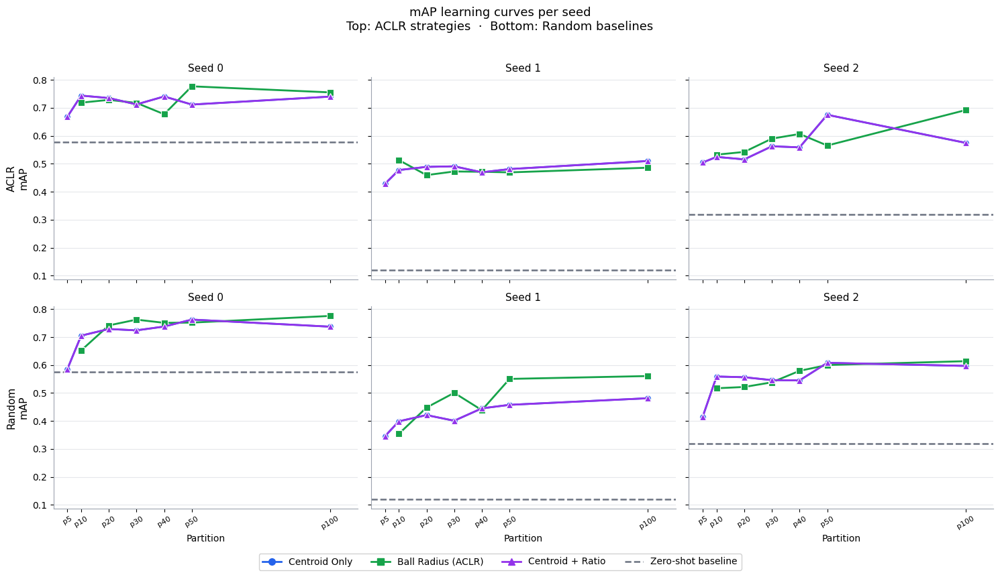

In [22]:
fig = plot_per_seed_grid(metric="mAP")

In [24]:
df_centr['aclr_method']=['centroid' for r in range(len(df_centr))]
df_ball['aclr_method']=['ball' for r in range(len(df_ball))]
df_ratio['aclr_method']=['ratio' for r in range(len(df_ratio))]
concat_df = pd.concat([df_centr,df_ball,df_ratio],axis=0)

In [25]:
concat_df.shape

(133, 33)

Text(0.5, 1.0, 'Comparison of ACLR Methods \n Mean across all seeds')

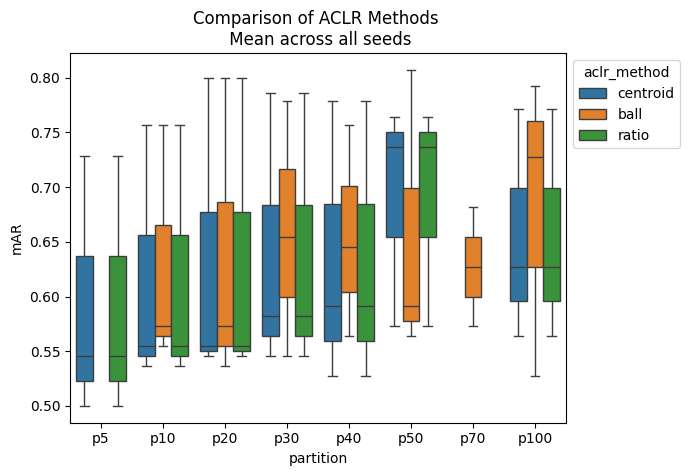

In [26]:
df_filter = concat_df.loc[concat_df['method']=='aclr']
ax = sns.boxplot(data = df_filter,
                x = "partition",
                y="mAR",
                hue="aclr_method",
                order=["p5","p10","p20","p30","p40","p50","p70","p100"]
                )
sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
ax.set_title("Comparison of ACLR Methods \n Mean across all seeds")

In [51]:
filtered_df = concat_df.loc[concat_df['method']!="baseline"]

In [57]:
concat_df.loc[(concat_df['aclr_method']=="centroid")&(concat_df['method']=="aclr")&(concat_df['partition']=="p100")]

,seed,eval_key,mAP,mAR,f1_threshold,f1,precision_f1,recall_f1,tp_f1,fp_f1,...,f1_score,precision,recall,tp,fp,fn,method,partition,baseline_bool,aclr_method
5,0,aclr_p100_seed0_nms,0.740173,0.771429,0.812714,0.923077,1.0,0.857143,12,0,...,0.923077,1.0,0.857143,12,0,2,aclr,p100,False,centroid
0,1,aclr_p100_seed1_nms,0.509859,0.563636,0.645276,0.900000,1.0,0.818182,9,0,...,0.900000,1.0,0.818182,9,0,2,aclr,p100,False,centroid
0,2,aclr_p100_seed2_nms,0.574889,0.627273,0.689598,0.842105,1.0,0.727273,8,0,...,0.842105,1.0,0.727273,8,0,3,aclr,p100,False,centroid


In [55]:
import plotly.graph_objects as go
import pandas as pd
import numpy as np

# ── Constants ─────────────────────────────────────────────────────────────────
PARTITION_ORDER = ["p5", "p10", "p20", "p30", "p40", "p50", "p100"]

COLOR_TP = "#16A34A"   # green
COLOR_FP = "#DC2626"   # red
COLOR_FN = "#F59E0B"   # amber
COLOR_F1 = "#2563EB"   # blue

STRATEGIES = {
    "Centroid Only":      df_centr,
    "Ball Radius (ACLR)": df_ball,
    "Centroid + Ratio":   df_ratio,
}


# ── Aggregate ─────────────────────────────────────────────────────────────────

def _agg_counts(df: pd.DataFrame, partition: str) -> pd.DataFrame:
    """
    Mean and std of TP / FP / FN / F1 across seeds per method.

    Returns columns:
        method | tp_m | tp_s | fp_m | fp_s | fn_m | fn_s | f1_m | f1_s
    """
    part_df = df[df["partition"] == partition]
    agg = (
        part_df
        .groupby("method")[["tp_f1", "fp_f1", "fn_f1", "f1"]]
        .agg(["mean", "std"])
        .reset_index()
    )
    # Flatten MultiIndex
    agg.columns = [
        "method" if c[0] == "method"
        else f"{c[0].replace('_f1', '')}_{c[1][0]}"
        for c in agg.columns
    ]
    agg = agg.rename(columns={"f1_m": "f1_m", "f1_s": "f1_s"})
    agg["f1_s"] = agg["f1_s"].fillna(0)
    return agg


# ── Trace builder ─────────────────────────────────────────────────────────────

def _build_bar_traces(df: pd.DataFrame, partition: str) -> list:
    agg     = _agg_counts(df, partition)
    traces  = []
    methods = agg["method"].tolist()

    # Scale F1 [0,1] → primary axis range
    max_count = max(
        agg["tp_m"].max(),
        agg["fp_m"].max(),
        agg["fn_m"].max(),
    )
    f1_scale = max_count

    # ── TP ────────────────────────────────────────────────────────────────
    tp_m = agg["tp_m"].tolist()
    tp_s = agg["tp_s"].fillna(0).tolist()
    traces.append(go.Bar(
        name         = "TP",
        x            = methods,
        y            = tp_m,
        marker_color = COLOR_TP,
        opacity      = 0.85,
        yaxis        = "y",
        legendgroup  = "TP",
        error_y      = dict(type="data", array=tp_s,
                            visible=True, color=COLOR_TP,
                            thickness=2, width=6),
        customdata   = [f"TP: {m:.1f} ± {s:.1f}"
                        for m, s in zip(tp_m, tp_s)],
        hovertemplate= "%{customdata}<extra>%{x}</extra>",
    ))

    # ── FP ────────────────────────────────────────────────────────────────
    fp_m = agg["fp_m"].tolist()
    fp_s = agg["fp_s"].fillna(0).tolist()
    traces.append(go.Bar(
        name         = "FP",
        x            = methods,
        y            = fp_m,
        marker_color = COLOR_FP,
        opacity      = 0.85,
        yaxis        = "y",
        legendgroup  = "FP",
        error_y      = dict(type="data", array=fp_s,
                            visible=True, color=COLOR_FP,
                            thickness=2, width=6),
        customdata   = [f"FP: {m:.1f} ± {s:.1f}"
                        for m, s in zip(fp_m, fp_s)],
        hovertemplate= "%{customdata}<extra>%{x}</extra>",
    ))

    # ── FN ────────────────────────────────────────────────────────────────
    fn_m = agg["fn_m"].tolist()
    fn_s = agg["fn_s"].fillna(0).tolist()
    traces.append(go.Bar(
        name         = "FN",
        x            = methods,
        y            = fn_m,
        marker_color = COLOR_FN,
        opacity      = 0.85,
        yaxis        = "y",
        legendgroup  = "FN",
        error_y      = dict(type="data", array=fn_s,
                            visible=True, color=COLOR_FN,
                            thickness=2, width=6),
        customdata   = [f"FN: {m:.1f} ± {s:.1f}"
                        for m, s in zip(fn_m, fn_s)],
        hovertemplate= "%{customdata}<extra>%{x}</extra>",
    ))

    # ── F1 — rescaled to primary axis ─────────────────────────────────────
    f1_m        = agg["f1_m"].tolist()
    f1_s        = agg["f1_s"].tolist()
    f1_scaled   = [v * f1_scale for v in f1_m]
    f1_s_scaled = [v * f1_scale for v in f1_s]
    traces.append(go.Bar(
        name         = "F1",
        x            = methods,
        y            = f1_scaled,
        marker_color = COLOR_F1,
        opacity      = 0.85,
        yaxis        = "y",
        legendgroup  = "F1",
        error_y      = dict(type="data", array=f1_s_scaled,
                            visible=True, color=COLOR_F1,
                            thickness=2, width=6),
        customdata   = [f"F1: {m:.3f} ± {s:.3f}"
                        for m, s in zip(f1_m, f1_s)],
        hovertemplate= "%{customdata}<extra>%{x}</extra>",
    ))

    return traces


# ── Main figure ───────────────────────────────────────────────────────────────

def plot_counts_bar(
    height: int = 540,
    width:  int = 720,
) -> go.Figure:

    strategy_names  = list(STRATEGIES.keys())
    first_strategy  = strategy_names[0]
    first_partition = PARTITION_ORDER[0]

    # Pre-build ALL (strategy, partition) combinations
    all_traces = {
        (name, partition): _build_bar_traces(df, partition)
        for name, df in STRATEGIES.items()
        for partition in PARTITION_ORDER
    }

    # Initialise with first combination
    fig = go.Figure()
    for trace in all_traces[(first_strategy, first_partition)]:
        fig.add_trace(trace)

    def _button_args(s_name, partition):
        traces = all_traces[(s_name, partition)]
        return [
            {
                "x":          [t.x for t in traces],
                "y":          [t.y for t in traces],
                "customdata": [
                    t.customdata if hasattr(t, "customdata")
                    and t.customdata is not None else []
                    for t in traces
                ],
                "error_y": [
                    dict(
                        type      = "data",
                        array     = list(t.error_y.array)
                                    if hasattr(t, "error_y")
                                    and t.error_y is not None
                                    and t.error_y.array is not None
                                    else [],
                        visible   = True,
                        thickness = 2,
                        width     = 6,
                    )
                    for t in traces
                ],
            },
            {
                "title.text": (
                    f"<b>TP / FP / FN / F1 — {s_name} | {partition}</b>"
                    "<br><sup>Mean ± 1 std across 3 seeds  ·  "
                    "F1 scaled to count range</sup>"
                )
            },
        ]

    # ── Strategy dropdown ─────────────────────────────────────────────────
    strategy_buttons = [
        dict(
            label  = s_name,
            method = "update",
            args   = _button_args(s_name, first_partition),
        )
        for s_name in strategy_names
    ]

    # ── Combined strategy + partition dropdown ────────────────────────────
    combo_buttons = [
        dict(
            label  = f"{s_name[:8]}.. | {partition}",
            method = "update",
            args   = _button_args(s_name, partition),
        )
        for s_name in strategy_names
        for partition in PARTITION_ORDER
    ]

    fig.update_layout(
        updatemenus=[
            dict(
                buttons    = strategy_buttons,
                direction  = "down",
                showactive = True,
                x=0.01, xanchor="left", y=1.22, yanchor="top",
                bgcolor="white", bordercolor="#9CA3AF",
                font=dict(size=12),
            ),
            dict(
                buttons    = combo_buttons,
                direction  = "down",
                showactive = True,
                x=0.35, xanchor="left", y=1.22, yanchor="top",
                bgcolor="white", bordercolor="#9CA3AF",
                font=dict(size=11),
            ),
        ],
        annotations=[
            dict(text="Strategy", x=0.01, y=1.30,
                 xref="paper", yref="paper",
                 showarrow=False, font=dict(size=11)),
            dict(text="Strategy | Partition", x=0.35, y=1.30,
                 xref="paper", yref="paper",
                 showarrow=False, font=dict(size=11)),
        ],
        title=dict(
            text=(
                f"<b>TP / FP / FN / F1 — {first_strategy} | {first_partition}</b>"
                "<br><sup>Mean ± 1 std across 3 seeds  ·  "
                "F1 scaled to count range</sup>"
            ),
            x=0.5, xanchor="center", font=dict(size=14),
        ),
        barmode  = "group",
        xaxis    = dict(title="Method", showgrid=False, linecolor="#9CA3AF"),
        yaxis    = dict(
            title     = "Counts (TP / FP / FN)  ·  F1 scaled to same range",
            showgrid  = True,
            gridcolor = "#E5E7EB",
            linecolor = "#9CA3AF",
        ),
        legend   = dict(
            orientation = "h",
            yanchor     = "bottom",
            y           = -0.20,
            xanchor     = "center",
            x           = 0.5,
            font        = dict(size=11),
        ),
        height        = height,
        width         = width,
        plot_bgcolor  = "white",
        paper_bgcolor = "white",
        font          = dict(family="Arial", size=12),
    )

    return fig


# ── Usage ─────────────────────────────────────────────────────────────────────
fig = plot_counts_bar()
fig.show()

# Check json

In [ ]:
import json

aclr_ratio_path = "/share/home/e2406743/code/Dugongs_IRISA-MARBEC-LIRMM/chapter2_FLPLAN/splits_json/splits_seeds012_mapped.json"
ball_path = "/share/home/e2406743/code/Dugongs_IRISA-MARBEC-LIRMM/chapter2_FLPLAN/splits_json/aclr_v3_ball_seed012_6cluster_mapped.json"
centroid_path = "/share/home/e2406743/code/Dugongs_IRISA-MARBEC-LIRMM/chapter2_FLPLAN/splits_json/aclr_v4_centroid_seed012_6cluster_mapped.json"

with open(aclr_ratio_path, "r") as f:
    ratio = json.load(f)

In [70]:
for seed in ["0","1","2"]:
    print(f"Seed:{seed}")
    seedd = ratio[seed]["train"]
    for p in ["p100"]: #seedd.keys():
        print(f"At partition:{p}")
        for mm in ["random"]:
            print(len(seedd[p][mm]["images"]))
            
        

Seed:0
At partition:p100
223
Seed:1
At partition:p100
245
Seed:2
At partition:p100
247


# Where the model fails? 

In [27]:
view_test0 = dataset.load_saved_view('view_test0')
view_test1 = dataset.load_saved_view('view_test1')
view_test2 = dataset.load_saved_view('view_test2')

In [79]:
print("Number of images with zero-shot False-Negative")
fn_view = dataset.match(F(f"baseline_seed0_nms_fn") > 0)
seed0_fn = fn_view.values('id')
print(f"seed 0 ={len(seed0_fn)}")
fn_view = dataset.match(F(f"baseline_seed1_nms_fn") > 0)
seed1_fn = fn_view.values('id')
print(f"seed 1 ={len(seed1_fn)}")
fn_view = dataset.match(F(f"baseline_seed2_nms_fn") > 0)
seed2_fn = fn_view.values('id')
print(f"seed 2 ={len(seed2_fn)}")

Number of images with zero-shot False-Negative
seed 0 =3
seed 1 =5
seed 2 =5


In [59]:
final_list = []
for l in [seed0_fn,seed1_fn,seed2_fn]:
    for id in l:
        final_list.append(l)

Total unique FN samples: 13


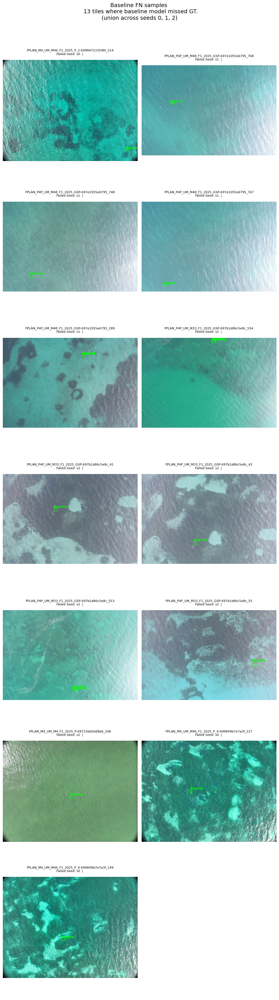

In [66]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
import numpy as np
import math

GT_FIELD         = "ground_truth"

# ── Build final unique ID list ────────────────────────────────────────────────
final_ids = list(set(seed0_fn + seed1_fn + seed2_fn))
fn_view   = dataset.select(final_ids)
samples   = list(fn_view.iter_samples())

print(f"Total unique FN samples: {len(samples)}")

# ── Plot config ───────────────────────────────────────────────────────────────
N_COLS   = 2
N_ROWS   = math.ceil(len(samples) / N_COLS)
FIG_W    = 5 * N_COLS
FIG_H    = 5 * N_ROWS

fig, axes = plt.subplots(N_ROWS, N_COLS, figsize=(FIG_W, FIG_H))
axes_flat = axes.flatten() if N_ROWS > 1 else list(axes)

for ax_idx, sample in enumerate(samples):
    ax  = axes_flat[ax_idx]
    img = Image.open(sample.filepath).convert("RGB")
    W, H = img.size

    ax.imshow(img)
    ax.axis("off")

    # ── Ground truth boxes ────────────────────────────────────────────────
    detections = sample[GT_FIELD].detections if sample[GT_FIELD] else []

    for det in detections:
        # FiftyOne stores boxes as [x, y, w, h] normalised top-left
        x, y, w, h = det.bounding_box
        x_px = x * W
        y_px = y * H
        w_px = w * W
        h_px = h * H

        rect = patches.Rectangle(
            (x_px, y_px), w_px, h_px,
            linewidth = 1,
            edgecolor = "lime",
            facecolor = "none",
        )
        ax.add_patch(rect)
        ax.text(
            x_px, y_px - 4,
            f"{det.label}",
            fontsize   = 8,
            color      = "lime",
            fontweight = "bold",
            clip_on    = True,
        )

    # ── Title — show which seeds failed ───────────────────────────────────
    failed_seeds = []
    if sample.id in set(seed0_fn): failed_seeds.append("s0")
    if sample.id in set(seed1_fn): failed_seeds.append("s1")
    if sample.id in set(seed2_fn): failed_seeds.append("s2")

    tile_label = Path(sample.filepath).stem

    ax.set_title(
        f"{tile_label}\nFailed Seed: {', '.join(failed_seeds)}  | \n ",
        fontsize = 8,
        pad      = 4,
    )

# ── Hide unused axes ──────────────────────────────────────────────────────────
for ax in axes_flat[len(samples):]:
    ax.axis("off")

plt.suptitle(
    f"Baseline FN samples \n {len(samples)} tiles where baseline model missed GT.\n"
    f"(union across seeds 0, 1, 2)",
    fontsize = 14,
    y        = 1.01,
)
plt.tight_layout()
plt.show()

### After Domain Adaptation - Partition 10

In [32]:
from  fiftyone import ViewField as F

print("Number of images with 10% partition containing False-Negative")
fn_view = dataset.match(F(f"aclr_p10_seed0_nms_fn") > 0)
seed0_fn = fn_view.values('id')
print(f"seed 0 ={len(seed0_fn)}")
fn_view = dataset.match(F(f"aclr_p10_seed1_nms_fn") > 0)
seed1_fn = fn_view.values('id')
print(f"seed 1 ={len(seed1_fn)}")
fn_view = dataset.match(F(f"aclr_p10_seed2_nms_fn") > 0)
seed2_fn = fn_view.values('id')
print(f"seed 2 ={len(seed2_fn)}")

Number of images with 10% partition containing False-Negative
seed 0 =0
seed 1 =3
seed 2 =3


Total unique FN samples: 6


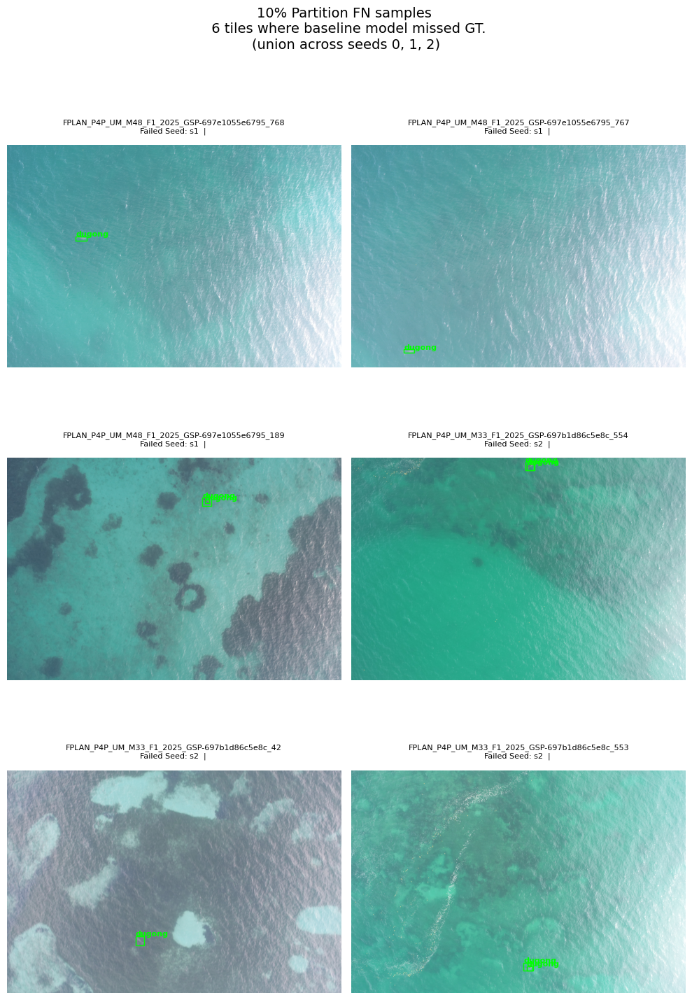

In [35]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
import numpy as np
import math

GT_FIELD         = "ground_truth"

# ── Build final unique ID list ────────────────────────────────────────────────
final_ids = list(set(seed0_fn + seed1_fn + seed2_fn))
fn_view   = dataset.select(final_ids)
samples   = list(fn_view.iter_samples())

print(f"Total unique FN samples: {len(samples)}")

# ── Plot config ───────────────────────────────────────────────────────────────
N_COLS   = 2
N_ROWS   = math.ceil(len(samples) / N_COLS)
FIG_W    = 5 * N_COLS
FIG_H    = 5 * N_ROWS

fig, axes = plt.subplots(N_ROWS, N_COLS, figsize=(FIG_W, FIG_H))
axes_flat = axes.flatten() if N_ROWS > 1 else list(axes)

for ax_idx, sample in enumerate(samples):
    ax  = axes_flat[ax_idx]
    img = Image.open(sample.filepath).convert("RGB")
    W, H = img.size

    ax.imshow(img)
    ax.axis("off")

    # ── Ground truth boxes ────────────────────────────────────────────────
    detections = sample[GT_FIELD].detections if sample[GT_FIELD] else []

    for det in detections:
        # FiftyOne stores boxes as [x, y, w, h] normalised top-left
        x, y, w, h = det.bounding_box
        x_px = x * W
        y_px = y * H
        w_px = w * W
        h_px = h * H

        rect = patches.Rectangle(
            (x_px, y_px), w_px, h_px,
            linewidth = 1,
            edgecolor = "lime",
            facecolor = "none",
        )
        ax.add_patch(rect)
        ax.text(
            x_px, y_px - 4,
            f"{det.label}",
            fontsize   = 8,
            color      = "lime",
            fontweight = "bold",
            clip_on    = True,
        )

    # ── Title — show which seeds failed ───────────────────────────────────
    failed_seeds = []
    if sample.id in set(seed0_fn): failed_seeds.append("s0")
    if sample.id in set(seed1_fn): failed_seeds.append("s1")
    if sample.id in set(seed2_fn): failed_seeds.append("s2")

    tile_label = Path(sample.filepath).stem

    ax.set_title(
        f"{tile_label}\nFailed Seed: {', '.join(failed_seeds)}  | \n ",
        fontsize = 8,
        pad      = 4,
    )

# ── Hide unused axes ──────────────────────────────────────────────────────────
for ax in axes_flat[len(samples):]:
    ax.axis("off")

plt.suptitle(
    f"10% Partition FN samples \n {len(samples)} tiles where baseline model missed GT.\n"
    f"(union across seeds 0, 1, 2)",
    fontsize = 14,
    y        = 1.01,
)
plt.tight_layout()
plt.show()

### After Domain Adaptation - 50%

In [40]:
from  fiftyone import ViewField as F

print("Number of images with 10% partition containing False-Negative")
fn_view = dataset.match(F(f"random_p50_seed0_nms_fn") > 0)
seed0_fn = fn_view.values('id')
print(f"seed 0 ={len(seed0_fn)}")
fn_view = dataset.match(F(f"random_p50_seed1_nms_fn") > 0)
seed1_fn = fn_view.values('id')
print(f"seed 1 ={len(seed1_fn)}")
fn_view = dataset.match(F(f"random_p50_seed2_nms_fn") > 0)
seed2_fn = fn_view.values('id')
print(f"seed 2 ={len(seed2_fn)}")

Number of images with 10% partition containing False-Negative
seed 0 =0
seed 1 =1
seed 2 =2


Total unique FN samples: 3


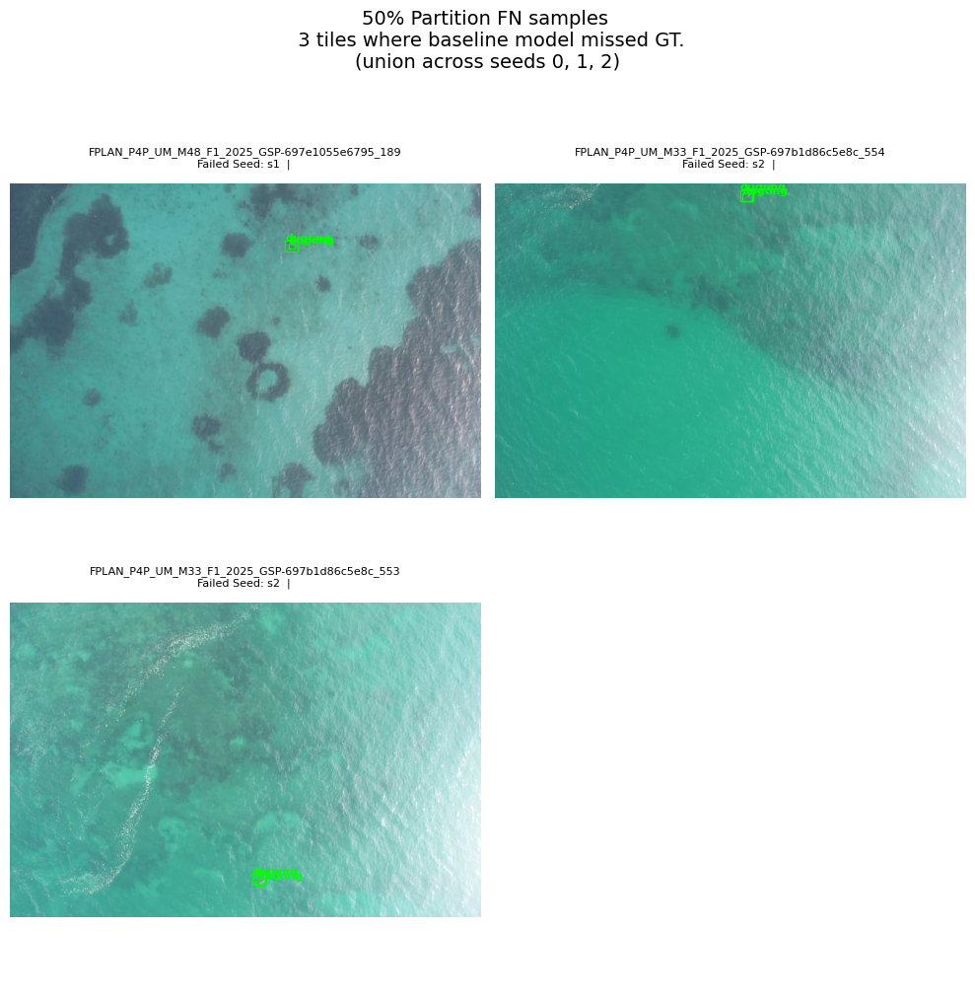

In [41]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
import numpy as np
import math

GT_FIELD         = "ground_truth"

# ── Build final unique ID list ────────────────────────────────────────────────
final_ids = list(set(seed0_fn + seed1_fn + seed2_fn))
fn_view   = dataset.select(final_ids)
samples   = list(fn_view.iter_samples())

print(f"Total unique FN samples: {len(samples)}")

# ── Plot config ───────────────────────────────────────────────────────────────
N_COLS   = 2
N_ROWS   = math.ceil(len(samples) / N_COLS)
FIG_W    = 5 * N_COLS
FIG_H    = 5 * N_ROWS

fig, axes = plt.subplots(N_ROWS, N_COLS, figsize=(FIG_W, FIG_H))
axes_flat = axes.flatten() if N_ROWS > 1 else list(axes)

for ax_idx, sample in enumerate(samples):
    ax  = axes_flat[ax_idx]
    img = Image.open(sample.filepath).convert("RGB")
    W, H = img.size

    ax.imshow(img)
    ax.axis("off")

    # ── Ground truth boxes ────────────────────────────────────────────────
    detections = sample[GT_FIELD].detections if sample[GT_FIELD] else []

    for det in detections:
        # FiftyOne stores boxes as [x, y, w, h] normalised top-left
        x, y, w, h = det.bounding_box
        x_px = x * W
        y_px = y * H
        w_px = w * W
        h_px = h * H

        rect = patches.Rectangle(
            (x_px, y_px), w_px, h_px,
            linewidth = 1,
            edgecolor = "lime",
            facecolor = "none",
        )
        ax.add_patch(rect)
        ax.text(
            x_px, y_px - 4,
            f"{det.label}",
            fontsize   = 8,
            color      = "lime",
            fontweight = "bold",
            clip_on    = True,
        )

    # ── Title — show which seeds failed ───────────────────────────────────
    failed_seeds = []
    if sample.id in set(seed0_fn): failed_seeds.append("s0")
    if sample.id in set(seed1_fn): failed_seeds.append("s1")
    if sample.id in set(seed2_fn): failed_seeds.append("s2")

    tile_label = Path(sample.filepath).stem

    ax.set_title(
        f"{tile_label}\nFailed Seed: {', '.join(failed_seeds)}  | \n ",
        fontsize = 8,
        pad      = 4,
    )

# ── Hide unused axes ──────────────────────────────────────────────────────────
for ax in axes_flat[len(samples):]:
    ax.axis("off")

plt.suptitle(
    f"50% Partition FN samples \n {len(samples)} tiles where baseline model missed GT.\n"
    f"(union across seeds 0, 1, 2)",
    fontsize = 14,
    y        = 1.01,
)
plt.tight_layout()
plt.show()

# Highest F1 score accross all runs

In [ ]:

concat_df["partition_int"] = concat_df["partition"].apply(lambda x:int(''.join(filter(str.isdigit,x))))
fig = px.scatter(concat_df,
                x="precision_f1",
                y="recall_f1",
                color="aclr_method",
                hover_data=['seed','f1',"partition","aclr_method","method"],
                size="f1_score",
                title="Precision vs Recall at optimal F1 threshold. "
                )
fig.show()

# Questions

 - Is the dataset hindering true evaluation of the methods?
 - Is there signficance difference between random choice and active learning? 
 - 
 

## Next Steps

- Consolidate West Papua Dataset by removing duplicated images and manually selected representative scenarios. (Done: 2500 images to 154 images.)
- Re-run all the evaluation in a new dataset.
- Check OT augmentation for small partitions size and low epochs.

![alt text](../presentation/images/ot_aug.png)

![alt text](../presentation/images/ot2.png)

# Thank you 